<img src="images/ntb.png" width="240" height="240" align="left"/>
<div style="text-align: right"> Machine Learning <br> FS 2019 <br> Antonio Rosolia <br> 10.06.2019</div>

# Machine Learning End to End Project - Flower Recognition with CNN

## Introduction
The flower dataset contains 4242 images of flowers. The data collection is based on the data flicr, google images, yandex images. The pictures are divided into five classes: chamomile, tulip, rose, sunflower, dandelion. For each class there are about 800 photos. Photos are not high resolution, about 320x240 pixels. Photos are not reduced to a single size, they have different proportions!

This dataset can be found on https://www.kaggle.com/alxmamaev/flowers-recognition

## Objectives
The aim of this project is to classify a photo of a plant to the correct plant species. The image classification is done using Deep Learning. 
## Approach
In this project Keras is used to build a convolutional neural network for image classification.

The following layers will be added to the CNN:<br>
-Convolutional Layer<br>
-Pooling Layer<br>
-Flattening Layer<br>
-Neural Network<br>
<img src="images/cnn.png"/>
Arichitecture of a CNN -  Source: https://www.mathworks.com/videos/introduction-to-deep-learning-what-are-convolutional-neural-networks--1489512765771.html

### Note
This Jupyter notebook was run on a Google Cloud VM with GPU.

## Explorative Data Analysis

In [1]:
#importing libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
import warnings
import tensorflow as tf
import imageio
from pathlib import Path
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
warnings.simplefilter('ignore')


%matplotlib inline

Using TensorFlow backend.


All pictures are going to be packed together with the category in a Dataframe.

In [214]:
# Path of the Images
input_path = './data/flowers'

# Get all the species
flower_types = os.listdir(input_path)
print("Number of flower species: ", len(flower_types))
print("Flower species: ", flower_types)

Number of flower species:  5
Flower species:  ['sunflower', 'rose', 'dandelion', 'tulip', 'daisy']


In [215]:
flowers = []

for species in flower_types:
    # Get all the file names
    all_flowers = os.listdir(input_path +'/'+ species)
    # Add them to the list
    for flower in all_flowers:
        flowers.append((species, str(input_path +'/'+species) + '/' + flower))

# Build a dataframe        
df_flower = pd.DataFrame(data=flowers, columns=['category', 'image'], index=None)
df_flower.head()

,category,image
0,sunflower,./data/flowers/sunflower/5004121118_e9393e60d0...
1,sunflower,./data/flowers/sunflower/7721658400_0dec46d225...
2,sunflower,./data/flowers/sunflower/2883115609_5a69357b5d...
3,sunflower,./data/flowers/sunflower/3154932076_eff5c38231...
4,sunflower,./data/flowers/sunflower/22405882322_d4561f846...


In [4]:
df_flower['category'].value_counts()

dandelion    1052
tulip         984
rose          784
daisy         769
sunflower     734
Name: category, dtype: int64

Text(0, 0.5, 'count')

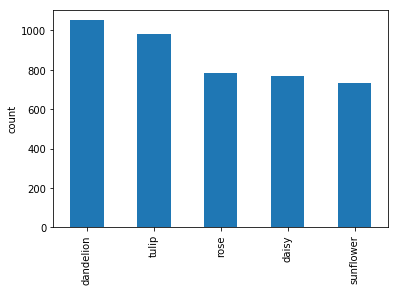

In [5]:
df_flower['category'].value_counts().plot(kind="bar")
plt.ylabel('count')

As we can see in the above barplot, all plants have about the same number of pictures.

In addition, all images are checked to ensure they are in jpg format.

In [216]:
for index, cell in df_flower['image'].iteritems():
    if(cell.split(".")[2]!="jpg"):
        print("Cell "+ str(index) + " contains a file which is not in jpg format. File: " + cell)

Cell 2082 contains a file which is not in jpg format. File: ./data/flowers/dandelion/flickr.py
Cell 2333 contains a file which is not in jpg format. File: ./data/flowers/dandelion/run_me.py
Cell 2554 contains a file which is not in jpg format. File: ./data/flowers/dandelion/flickr.pyc


There are some Python files (not sure why), which will be deleted. Also the dataframe is going to be recreated, since these python files are in it.

In [217]:
if os.path.exists("./flowers/dandelion/flickr.py"):
    os.remove("./flowers/dandelion/flickr.py")
if os.path.exists("./flowers/dandelion/run_me.py"):
    os.remove("./flowers/dandelion/run_me.py")
if os.path.exists("./flowers/dandelion/flickr.pyc"):
    os.remove("./flowers/dandelion/flickr.pyc")

# Get all the species
flower_types = os.listdir(input_path)

flowers = []

for species in flower_types:
    # Get all the file names
    all_flowers = os.listdir(input_path +'/'+ species)
    # Add them to the list
    for flower in all_flowers:
        flowers.append((species, str(input_path +'/'+species) + '/' + flower))

# Build a dataframe        
df_flower = pd.DataFrame(data=flowers, columns=['category', 'image'], index=None)

In addition, the dimensions of the images will be checked.

In [4]:
height=[]
width=[]
colors=[]

for img in df_flower['image']:
    height.append(imageio.imread(img).shape[0])
    width.append(imageio.imread(img).shape[1])
    colors.append(imageio.imread(img).shape[2])
print("Minimum height: ", min(height)," Minimum width: ",min(width)," Minimum Colors: ", min(colors))

Minimum height:  80  Minimum width:  134  Minimum Colors:  3


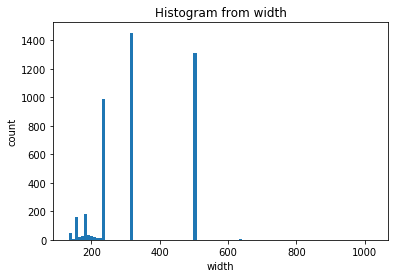

In [5]:
plt.hist(width, bins=100)
plt.title("Histogram from width")
plt.xlabel("width")
plt.ylabel("count")
plt.show()

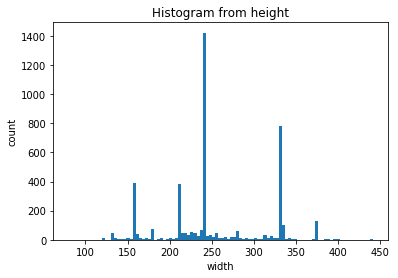

In [6]:
plt.hist(height, bins=100)
plt.title("Histogram from height")
plt.xlabel("width")
plt.ylabel("count")
plt.show()

These histograms are important to determine the input shape from the images.

Finally let's have a look at some flowers. The following images are randomly selected. Each time the cell is executed, different images appear.

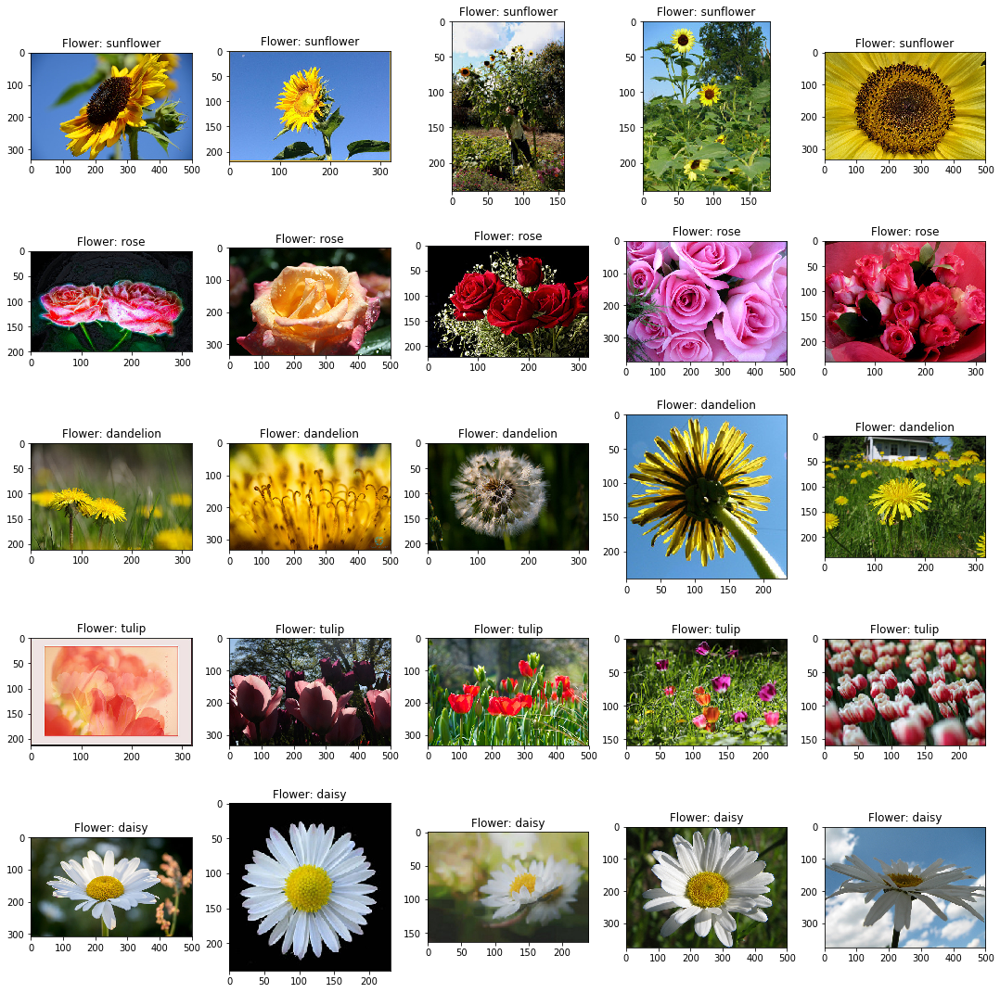

In [5]:
#creating random_sample array of imagepath which contains 5 images of each species
random_samples=[]
for species in flower_types:
    for sample in df_flower['image'].where(df_flower['category']==species).dropna().sample(5).values:
        random_samples.append(sample)

#ploting all the random samples
counter=0
fig,ax=plt.subplots(5,5)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (5):
        img= mpimg.imread(random_samples[counter],1)
        ax[i,j].imshow(img,cmap=None)
        ax[i,j].set_title('Flower: '+random_samples[counter].split("/")[2])
        counter+=1
        
        
plt.tight_layout()

Lovely. The images are going to be split in test and train sets. The size of the training set is 90%.

In [218]:
#Creating Train / Test folders
train_dir = '.data/train/'
test_dir = '.data/test/'

if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(test_dir):
    os.makedirs(test_dir)
for species in flower_types:
    if not os.path.exists(train_dir+species):
        os.makedirs(train_dir+species)
        os.makedirs(test_dir+species)
        all_species_images = df_flower['image'].where(df_flower['category']==species).dropna()
        y = df_flower['category'].where(df_flower['category']==species).dropna()
        X = df_flower['image'].where(df_flower['category']==species).dropna()
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
        for img in X_train:
            shutil.copy(img, ".data/train/"+species)
        for img in X_test:
            shutil.copy(img, ".data/test/"+species)

# CNN Model

First a simple model is created and trained. Then a more complicated model is trained and compared to the simple model.

<p>Since it is much faster to train and test a model on a GPU than on a CPU, the Tensorflow backend for Keras is going to be running on a GPU.<br>
According to the Keras <a href="https://keras.io/getting-started/faq/#how-can-i-run-keras-on-gpu">Documentation</a>:</p>
<i>if you are running on the TensorFlow or CNTK backends, your code will automatically run on GPU if any available GPU is detected.</i>
<p>So the first step is to ensure that a GPU is available.</p>

In [11]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 16365056253665686170
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 7672343860173145506
physical_device_desc: "device: XLA_GPU device"
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 8649577177623917736
physical_device_desc: "device: XLA_CPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 11276946637
locality {
  bus_id: 1
  links {
  }
}
incarnation: 18263407997947442078
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
]


Since a GPU is available Keras should be using TensorFlow on it.

In [6]:
import keras

# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Dense
from keras.models import Model
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator

In [6]:
# Initialising the CNN
classifier = Sequential()

### Step 1 - Convolution Layer

<p>[1]The first step of a CNN is the Convolution layer.</p>

<img src="images/ConvolutionLayer.gif">
<small>Convoluting a 5x5x1 image with a 3x3x1 kernel to get a 3x3x1 convolved feature</small>
<br>
<p>The objective of the convolution operation is to extract context and high-level features such as edges, from the input image. Also it helps to eliminate unnecessary informations and reduce dimensionality. The result of this layer are the Feature maps.</p> 


In [34]:
# Step 1 - Convolution
classifier.add(Conv2D(32, (3, 3), input_shape = (64, 64, 3), activation = 'relu'))
#32 feature detectors with the size of 3x3 will be applied on the input RGB images with size of 64x64

### Step 2 - Max Pooling Layer

[2]This layer is quite similar to the Convolution Layer. It stores the largest number from a feature map to a pooled feature map. 

<img src="images/MaxPooling.PNG">

<p>By pooling these features it stores highly important parts from the feature maps. Furthermore the size will be decreased and this step also helps to reduce overfitting.</p>

In [35]:
# Step 2 - Pooling
classifier.add(MaxPooling2D(pool_size = (2, 2)))
#a 2x2 pooling map will be applied to the feature maps

### Step 3 Flattening Layer
[3]The features map will be flattened into one single vector.

<img src="images/Flattening.PNG">

No spatial information will be lost, since the pooled the information is from the pooled feature maps, which has the context in it. The final numbers in the vectors, are the maximum numbers, which the feature detector had extracted.

In [36]:
# Step 3 - Flattening
classifier.add(Flatten())

### Step 4 - Full Connection

To classify the images, an artificial neural network will be used. It takes the flattening layer as input and the output will be one of the five categories. In the neural network the two following activation functions will be used:

#### ReLU (Rectified Linear Unit) Activation Function

[4]ReLU is the most commonly used activation function in neural networks, especially in CNNs. 

<img src="images/Relu.PNG">

- It’s cheap to compute as there is no complicated math. The model can therefore take less time to train or run.
- It converges faster. Linearity means that the slope doesn’t plateau, or “saturate,” when x gets large. It doesn’t have the vanishing gradient problem suffered by other activation functions like sigmoid or tanh.
- It’s sparsely activated. Since ReLU is zero for all negative inputs, it’s likely for any given unit to not activate at all. This is often desirable.

#### Softmax Activation Function
[5]The Softmax function is mainly used for mulitclass categorical classification.
<img src="images/softmax.PNG">

In [37]:
# Step 4 - Full connection
classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dense(units = 5, activation = 'softmax'))

In [38]:
# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [39]:
classifier.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 30752)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               3936384   
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 645       
Total params: 3,937,925
Trainable params: 3,937,925
Non-trainable params: 0
_________________________________________________________________


Keras has ImageDataGenerator class which allows the users to perform image augmentation on the fly in a very easy way, so that the model would never see twice the exact same picture. This helps prevent overfitting and helps the model generalize better.

In [219]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [220]:
training_set = train_datagen.flow_from_directory('.data/train',
                                                 target_size = (64, 64),
                                                 batch_size = 32,)

test_set = test_datagen.flow_from_directory('.data/test',
                                            target_size = (64, 64),
                                            batch_size = 32,)

Found 3888 images belonging to 5 classes.
Found 435 images belonging to 5 classes.


In [61]:
classifier.fit_generator(training_set,
                         steps_per_epoch = 3888,
                         epochs = 10,
                         validation_data = test_set,
                         validation_steps = 435)

Epoch 1/10
3888/3888 [==============================] - 793s 204ms/step - loss: 0.5355 - acc: 0.8001 - val_loss: 1.3561 - val_acc: 0.6685
Epoch 2/10
3888/3888 [==============================] - 790s 203ms/step - loss: 0.1460 - acc: 0.9510 - val_loss: 1.8817 - val_acc: 0.7013
Epoch 3/10
3888/3888 [==============================] - 808s 208ms/step - loss: 0.0775 - acc: 0.9752 - val_loss: 2.0277 - val_acc: 0.6846
Epoch 4/10
3888/3888 [==============================] - 803s 207ms/step - loss: 0.0584 - acc: 0.9817 - val_loss: 2.1429 - val_acc: 0.7110
Epoch 5/10
3888/3888 [==============================] - 792s 204ms/step - loss: 0.0488 - acc: 0.9851 - val_loss: 2.3503 - val_acc: 0.6934
Epoch 6/10
3888/3888 [==============================] - 801s 206ms/step - loss: 0.0363 - acc: 0.9887 - val_loss: 2.2808 - val_acc: 0.7010
Epoch 7/10
3888/3888 [==============================] - 805s 207ms/step - loss: 0.0360 - acc: 0.9887 - val_loss: 2.8582 - val_acc: 0.6666
Epoch 8/10
3888/3888 [============

The accuracy from this simple model is around 68% which is quite impressive. But still, the accuracy can be increased with a more complex model. Additionaly, this model has some serious overfitting problem. 

### CNN with VGG16 Model

[6]VGG16 was publised in 2014 and is one of the simplest. It is a convolutional neural network model proposed by K. Simonyan and A. Zisserman from the University of Oxford in the paper “Very Deep Convolutional Networks for Large-Scale Image Recognition”. The model achieves 92.7% top-5 test accuracy in ImageNet, which is a dataset of over 14 million images belonging to 1000 classes. It's Key Characteristics are:

- This network contains total 16 layers in which weights and bias parameters are learnt.
- A total of 13 convolutional layers are stacked one after the other and 3 dense layers for classification.
- The number of filters in the convolution layers follow an increasing pattern (similar to decoder architecture of autoencoder).
- The informative features are obtained by max pooling layers applied at different steps in the architecture.
- The dense layers comprises of 4096, 4096, and 1000 nodes each.
- The cons of this architecture are that it is slow to train and produces the model with very large size.

The VGG16 architecture is given below:

<img src="images/VGG16.png"/>


A pretrained VGG16 model can be downloaded from Keras. Unfortunately thre pretrained weights can not be used, since the input shape in this case is different. According to the Documentation, the weights will be randomly initialized. In addition to two dropout layers will be included in the model, to reduce overfitting and increase accuracy.

In [10]:
vgg16_model = keras.applications.vgg16.VGG16(input_shape=(80, 80, 3),classes=5, weights=None)


# Store the fully connected layers
fc1 = vgg16_model.layers[-3]
fc2 = vgg16_model.layers[-2]
predictions = vgg16_model.layers[-1]

# Create the dropout layers
dropout1 = Dropout(0.4)
dropout2 = Dropout(0.4)

# Reconnect the layers
model = Sequential()
for layer in vgg16_model.layers[:-3]:
    model.add(layer)

model.add(fc1)
model.add(dropout1)
model.add(fc2)
model.add(dropout2)
model.add(predictions)

In [11]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 80, 80, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 80, 80, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 40, 40, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 40, 40, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 40, 40, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 20, 20, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 20, 20, 256)       295168    
__________

The following steps have been taken to increase the accuracy from the basis VGG16 model with five training epochs (~70% accuracy):


- target_size has been increased to 80x80 (increased accuracy of ~+2%)
- batch_size has been decreased from 32 to 16 (increased accuracy of ~+2%)
- epochs has been increased from 10 to 50 (increased accuracy of ~+2%, 50 epochs are a bit of an overkill)
- learning rate has been set to 0.0001 (increased accuracy of ~+2%)
- Dropout Layer has been added (increased accuracy of ~+2%) and decreased overfitting a lot

Each of these steps came with the downside of longer calculation time.

In [12]:
model.compile(keras.optimizers.Adam(lr=0.0001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [14]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('./data/train',
                                                 target_size = (80, 80),
                                                 batch_size = 16)

test_set = test_datagen.flow_from_directory('./data/test',
                                            target_size = (80, 80),
                                            batch_size = 16)

history = model.fit_generator(training_set,
                         steps_per_epoch = 3888,
                         epochs = 50,
                         validation_data = test_set,
                         validation_steps = 435)

Found 3888 images belonging to 5 classes.
Found 435 images belonging to 5 classes.
Epoch 1/50
3888/3888 [==============================] - 607s 156ms/step - loss: 1.1017 - acc: 0.5412 - val_loss: 0.7718 - val_acc: 0.7314
Epoch 2/50
3888/3888 [==============================] - 607s 156ms/step - loss: 0.5850 - acc: 0.7866 - val_loss: 0.7445 - val_acc: 0.7721
Epoch 3/50
3888/3888 [==============================] - 606s 156ms/step - loss: 0.3128 - acc: 0.8869 - val_loss: 1.1667 - val_acc: 0.7361
Epoch 4/50
3888/3888 [==============================] - 606s 156ms/step - loss: 0.1654 - acc: 0.9431 - val_loss: 1.0530 - val_acc: 0.7539
Epoch 5/50
3888/3888 [==============================] - 607s 156ms/step - loss: 0.1021 - acc: 0.9661 - val_loss: 1.2316 - val_acc: 0.7555
Epoch 6/50
3888/3888 [==============================] - 606s 156ms/step - loss: 0.0783 - acc: 0.9748 - val_loss: 1.2160 - val_acc: 0.7630
Epoch 7/50
3888/3888 [==============================] - 607s 156ms/step - loss: 0.0638 - 

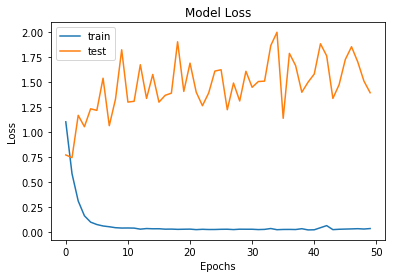

In [23]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

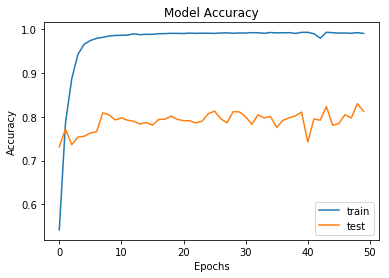

In [25]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

### Improving the model

Furthermore the model still can be improved:
- The model receives batch wise
- ReduceLROnPlateau will be used. It reduces learning rate when a metric has stopped improving. Models often benefit from reducing the learning rate by a factor of 2-10 once learning stagnates. This callback monitors a quantity and if no improvement is seen for a 'patience' number of epochs, the learning rate is reduced.
- Bigger input_shape of the pictures, with the knowledge, that some smaller pictures will lose quality.

In [11]:
vgg16_model = keras.applications.vgg16.VGG16(input_shape=(150, 150, 3),classes=5, weights=None)

# Store the fully connected layers
fc1 = vgg16_model.layers[-3]
fc2 = vgg16_model.layers[-2]
predictions = vgg16_model.layers[-1]

# Create the dropout layers
dropout1 = Dropout(0.4)
dropout2 = Dropout(0.4)

# Reconnect the layers
model2 = Sequential()
for layer in vgg16_model.layers[:-3]:
    model2.add(layer)

model2.add(fc1)
model2.add(dropout1)
model2.add(fc2)
model2.add(dropout2)
model2.add(predictions)

In [12]:
model2.compile(keras.optimizers.Adam(lr=0.0001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [13]:
from keras.callbacks import ReduceLROnPlateau

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.000001)


train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('./data/train',
                                                 target_size = (150, 150),
                                                 batch_size = 16)

test_set = test_datagen.flow_from_directory('./data/test',
                                            target_size = (150, 150),
                                            batch_size = 16)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', patience=3, verbose=1, factor=0.5, min_lr=2.5e-5)

history = model2.fit_generator(training_set,
                         steps_per_epoch = 3888 //16,
                         epochs = 100,
                         validation_data = test_set,
                         validation_steps = 435 // 16,
                         callbacks=[learning_rate_reduction])

Found 3888 images belonging to 5 classes.
Found 435 images belonging to 5 classes.
Epoch 1/100
243/243 [==============================] - 90s 370ms/step - loss: 1.4958 - acc: 0.3107 - val_loss: 1.2962 - val_acc: 0.4375
Epoch 2/100
243/243 [==============================] - 80s 331ms/step - loss: 1.3084 - acc: 0.4108 - val_loss: 1.3019 - val_acc: 0.4344
Epoch 3/100
243/243 [==============================] - 80s 328ms/step - loss: 1.2745 - acc: 0.4257 - val_loss: 1.2185 - val_acc: 0.4344
Epoch 4/100
243/243 [==============================] - 80s 328ms/step - loss: 1.2532 - acc: 0.4493 - val_loss: 1.1435 - val_acc: 0.4749
Epoch 5/100
243/243 [==============================] - 80s 328ms/step - loss: 1.1833 - acc: 0.4985 - val_loss: 1.2128 - val_acc: 0.4988
Epoch 6/100
243/243 [==============================] - 80s 328ms/step - loss: 1.1076 - acc: 0.5517 - val_loss: 1.0635 - val_acc: 0.5728
Epoch 7/100
243/243 [==============================] - 80s 328ms/step - loss: 1.0495 - acc: 0.5910 - 

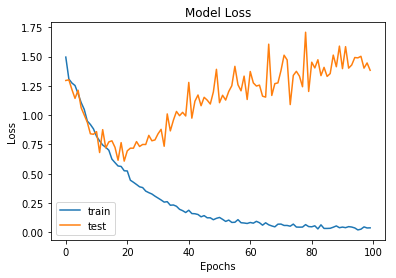

In [14]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

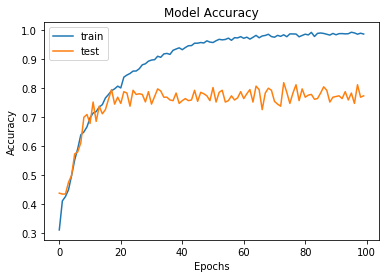

In [15]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

As it can bee seen, the newer version of the VGG16 model didn't improved and has the same model accuracy. Therefore a new model will be tried. The new model is the ResNet50.

In [5]:
from keras.applications.resnet50 import ResNet50

In [8]:
resnet50_model = ResNet50(include_top=True, weights=None, input_shape=(150, 150, 3), classes = 5)

In [9]:
resnet50_model.compile(keras.optimizers.Adam(lr=0.0001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

from keras.callbacks import ReduceLROnPlateau

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.000001)


train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('./data/train',
                                                 target_size = (150, 150),
                                                 batch_size = 16)

test_set = test_datagen.flow_from_directory('./data/test',
                                            target_size = (150, 150),
                                            batch_size = 16)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', patience=3, verbose=1, factor=0.5, min_lr=2.5e-5)

history = resnet50_model.fit_generator(training_set,
                         steps_per_epoch = 3888 //16,
                         epochs = 100,
                         validation_data = test_set,
                         validation_steps = 435 // 16,
                         callbacks=[learning_rate_reduction])

Found 3888 images belonging to 5 classes.
Found 435 images belonging to 5 classes.
Epoch 1/100
243/243 [==============================] - 119s 491ms/step - loss: 1.4375 - acc: 0.4164 - val_loss: 3.8128 - val_acc: 0.2269
Epoch 2/100
243/243 [==============================] - 96s 394ms/step - loss: 1.2383 - acc: 0.4949 - val_loss: 2.0891 - val_acc: 0.4224
Epoch 3/100
243/243 [==============================] - 96s 393ms/step - loss: 1.1617 - acc: 0.5283 - val_loss: 1.3277 - val_acc: 0.4916
Epoch 4/100
243/243 [==============================] - 95s 393ms/step - loss: 1.1148 - acc: 0.5540 - val_loss: 1.1006 - val_acc: 0.5704
Epoch 5/100
243/243 [==============================] - 96s 396ms/step - loss: 1.1005 - acc: 0.5556 - val_loss: 1.3123 - val_acc: 0.5632
Epoch 6/100
243/243 [==============================] - 96s 394ms/step - loss: 1.0464 - acc: 0.5864 - val_loss: 1.4699 - val_acc: 0.5776
Epoch 7/100
243/243 [==============================] - 95s 391ms/step - loss: 1.0408 - acc: 0.5880 -

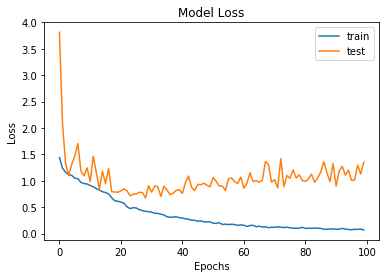

In [10]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

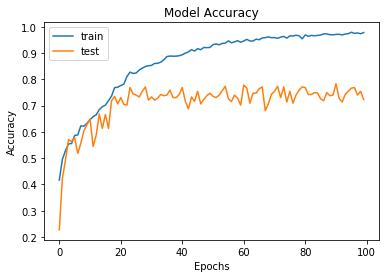

In [11]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

Unfortunately, the accuracy on the validation set hasn't changed. Therefore, it will be investigated which plant species had the most problems.

In [222]:
test_set = test_datagen.flow_from_directory('./data/test',
                                            target_size = (150, 150),
                                            batch_size = 435,
                                            shuffle = False)

Found 435 images belonging to 5 classes.


<Figure size 432x288 with 0 Axes>

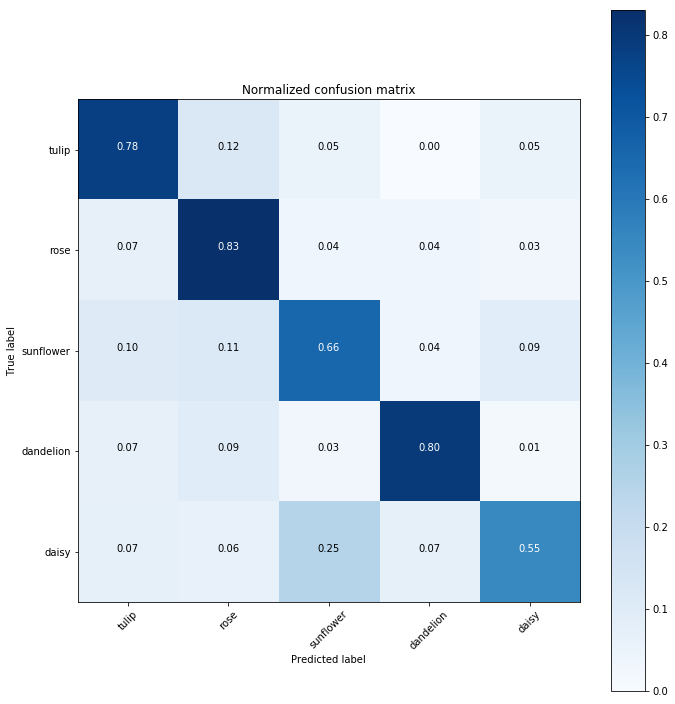

In [133]:
## copied from source[7]

predictions = resnet50_model.predict_generator(generator=test_set, steps=1)
y_pred = [np.argmax(probas) for probas in predictions]
y_test = test_set.classes
class_names = test_set.class_indices.keys()

from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
# compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Normalized confusion matrix')
plt.show()

All plant species except the sunflower and the rose were well classified. The sunflower and the marguerite had problems with each other, which is quite surprising, as these two plant species do not look very similar.

In the next cell all wrongly classified pictures are plotted with predicted and actual labels.

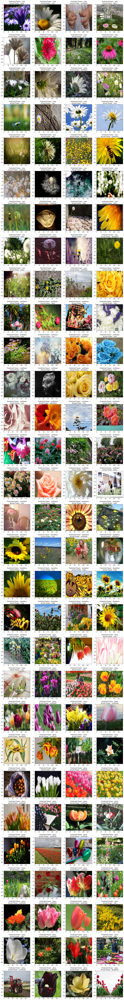

In [206]:
x,y = test_set[0]
class_name = list(test_set.class_indices)
pictrues_length = int(round((len(mis_class)/4),0))


fig,ax=plt.subplots(pictrues_length,4)
fig.set_size_inches(15,8*15)

count=0
for i in range (pictrues_length):
    for j in range (4):
        ax[i,j].imshow(x[mis_class[count]])
        ax[i,j].set_title("Predicted Flower : "+class_name[np.argmax(y[mis_class[count]])]+"\n"+"Actual Flower : "+class_name[y_pred[mis_class[count]]])
        plt.tight_layout()
        count+=1

It seems that many images were wrongly labelled and therefore the dataset already contains errors. Also, the sunflower and daisy problem can be seen.

### Declaration of originality

I confirm that I have written this paper independently and have not used any resources other than those cited. The parts of the work which are taken from the wording or the meaning of other works (including Internet sources) have been marked with the indication of the source.

## Sources

[1] https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53<br>
[2] https://www.superdatascience.com/blogs/convolutional-neural-networks-cnn-step-max-pooling<br>
[3] https://www.superdatascience.com/convolutional-neural-networks-cnn-step-3-flattening/ <br>
[4] https://medium.com/tinymind/a-practical-guide-to-relu-b83ca804f1f7 <br>
[5] https://towardsdatascience.com/activation-functions-neural-networks-1cbd9f8d91d6<br>
[6] https://www.kaggle.com/shivamb/cnn-architectures-vgg-resnet-inception-tl <br>
[7] https://towardsdatascience.com/from-raw-images-to-real-time-predictions-with-deep-learning-ddbbda1be0e4